In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

# Decision Trees

They are a type of model used in machine learning for classification and regression tasks. They make decisions by splitting the data based on attributes, creating a tree structure where each branch represents a decision and each leaf represents an outcome. They're simple, interpretable, and can handle both numerical and categorical data. However, they can overfit and may need pruning or ensemble methods to improve performance.

[Decision and Classification Trees, Clearly Explained!!!](https://youtu.be/_L39rN6gz7Y?si=r7Hyz2ZAmnC2kt_Y)  
[Regression Trees, Clearly Explained!!!](https://youtu.be/g9c66TUylZ4?si=M9CgoyieLH7sXQq5)

![](https://www.mastersindatascience.org/wp-content/uploads/sites/54/2022/05/tree-graphic.jpg)

## Entropy

It is a measure of impurity or disorder in a dataset. It's used to decide how to split the data at each node of the tree. The goal is to minimize entropy, which means maximizing the homogeneity of the subsets created by the split. Entropy helps the decision tree algorithm determine the best attribute to split the data on for optimal classification.

$$H(X) = -\sum_{i=1}^{n} p_i \log_2(p_i)$$

![](https://miro.medium.com/v2/resize:fit:565/1*M15RZMSk8nGEyOnD8haF-A.png)

We conclude that:
- More the uncertainty, more the entropy. 

We can then define entropy as the measure of uncertainty.

## Information Gain

It is a measure used in decision trees to determine the effectiveness of a particular attribute in classifying data. It quantifies how much a given attribute reduces uncertainty in the data. It helps decide which attribute to split on by comparing the entropy or impurity before and after the split, aiming to maximize the gain and thus improve the purity of the resulting subsets.

$$\text{Information Gain } = H(T) - H(T|A)$$

Where:
- $H(T)$ is the entropy of the target variable T.
- $H(T|A)$ is the conditional entropy of the target variable T given the attribute A.

## Gini Impurity

It is a measure of how often a randomly chosen element from a set would be incorrectly labeled if it was randomly labeled according to the distribution of labels in the subset. It's commonly used in decision tree algorithms as a criterion for splitting nodes.

[Entropy, Information Gain & Gini Impurity - Decision Tree](https://youtu.be/jnV4W3RvVCE?si=J79kRSejYOHk-K-Z)

$$\text{Gini Impurity } = 1 - \sum_{i=1}^{C} p(i)^2$$

Where:
- $C$ is the number of classes.
- $p(i)$ is the probability of an element being classified as class $i$.
- The sum is taken over all classes.

## Intuition

Decision trees are like flowcharts where each node represents a feature, and each branch represents a decision based on that feature. In classification, the goal is to split data into classes, while in regression, it predicts a continuous value. The tree grows by selecting the most informative features at each node, optimizing to minimize classification errors or regression residuals. This intuitive approach makes decision trees easy to understand and interpret, resembling human decision-making processes. They're versatile, handling both classification and regression tasks efficiently while offering insights into the underlying data patterns.

## Algorithm

1. Start with the entire dataset.
2. Select the best feature to split the dataset, based on information gain, Gini impurity, mean squared error, or other metrics.
3. Partition the dataset into subsets based on the chosen feature.
4. Recursively repeat steps 2 and 3 for each subset until a stopping criterion is met (e.g., maximum depth, minimum samples per leaf).
5. For classification, assign the majority class label of the samples in a leaf node. For regression, assign the mean (or median) of the target values in a leaf node for prediction.

## Types of Decision Trees

1. Classification Trees
2. Regression Trees

### Classification Trees

Classification trees partition the feature space and aim to maximize purity in terms of class labels at each node. They select the feature that best separates the classes and assign the majority class to each segment. These trees are used for predicting categorical outcomes.

[Decision Tree Classification Clearly Explained!](https://youtu.be/ZVR2Way4nwQ?si=QQ4OCFL5poCEQdT4)

In [2]:
from sklearn.datasets import load_iris
iris = load_iris()

In [3]:
X = iris.data
y = iris.target

from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=2002)

In [4]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()

dtc.fit(X_train,y_train)
dtc.score(X_test,y_test)

0.8666666666666667

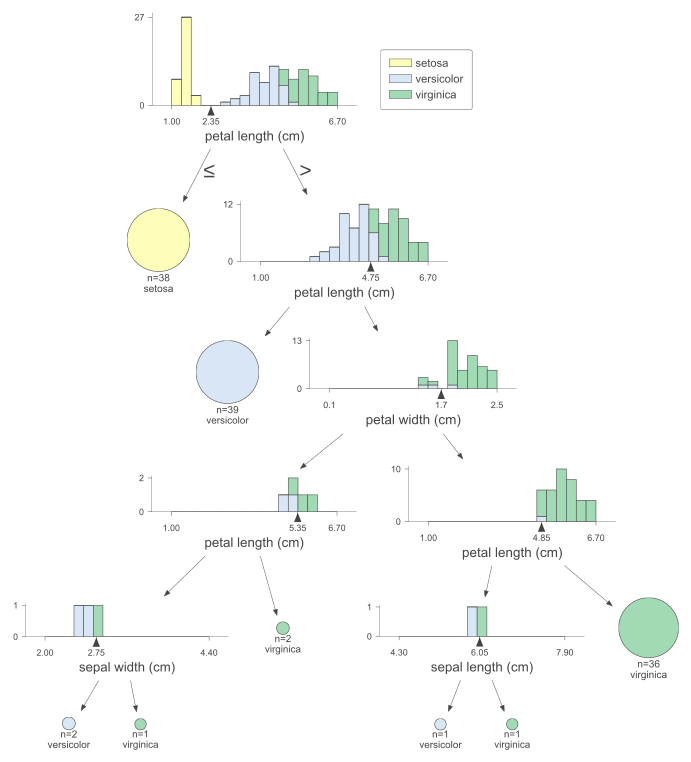

In [5]:
import dtreeviz

dtc = DecisionTreeClassifier()
dtc.fit(X_train,y_train)


viz = dtreeviz.model(dtc,X_train,y_train,
                     feature_names=iris.feature_names,class_names=iris.target_names)
viz.view(scale=1.5)

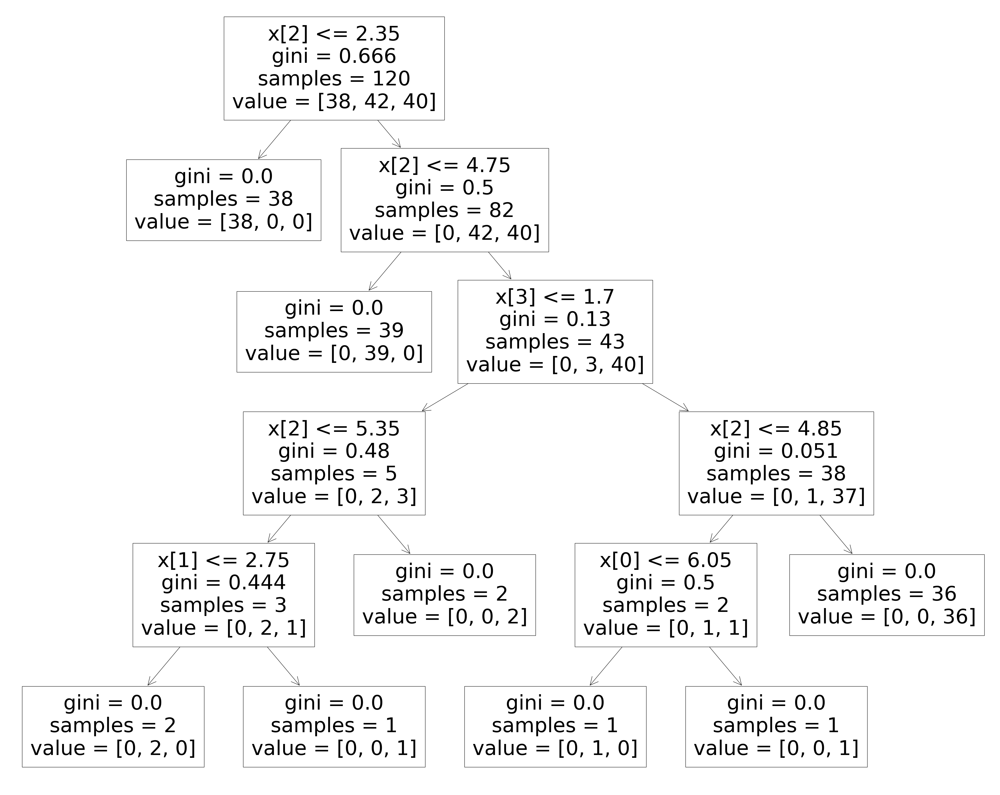

In [6]:
from sklearn.tree import plot_tree
plt.rcParams['figure.figsize'] = (50,40)
plot_tree(dtc);

#### Feature Importance

In [7]:
dtc.feature_importances_

array([0.01251043, 0.01668057, 0.95537081, 0.0154382 ])

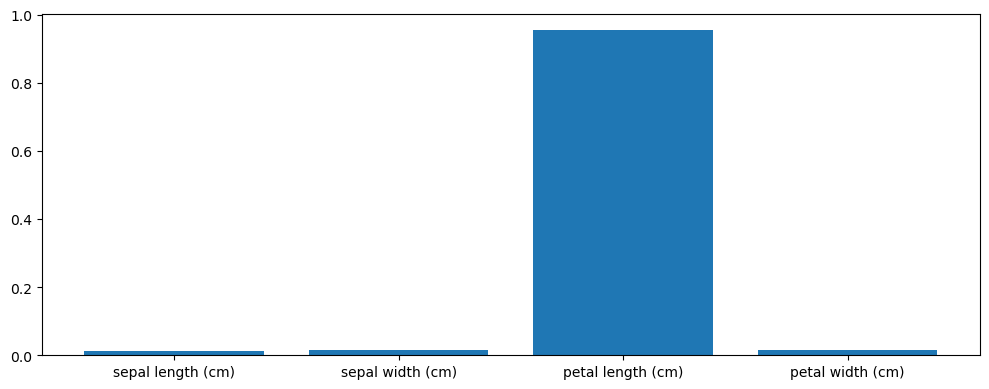

In [8]:
plt.figure(figsize=(10,4))
plt.bar(x=iris.feature_names,height=dtc.feature_importances_)
plt.tight_layout();

### Regression Trees

Regression trees segment the feature space into hierarchical binary decisions to predict continuous outcomes. At each node, they select the feature that best splits the data, aiming to minimize variance within each partition. The final prediction in each segment is typically the average of the target variable.

[Decision Tree Regression Clearly Explained!](https://youtu.be/UhY5vPfQIrA?si=KckbGzZyIKEpDVKA)

In [9]:
from sklearn.datasets import fetch_california_housing
df = fetch_california_housing(as_frame=True).frame

df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [10]:
X = df.iloc[:,:-1]
y = df.iloc[:,-1]

from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=2002)

In [11]:
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor()

dtr.fit(X_train,y_train)
dtr.score(X_test,y_test)

0.6054434563551061

In [12]:
!pip install dtreeviz

In [13]:
import dtreeviz

dtr = DecisionTreeRegressor(max_depth=3)
dtr.fit(X_train,y_train)


viz = dtreeviz.model(dtr,X_train,y_train,
                     feature_names=X.columns,target_name=y.name)
viz.view()

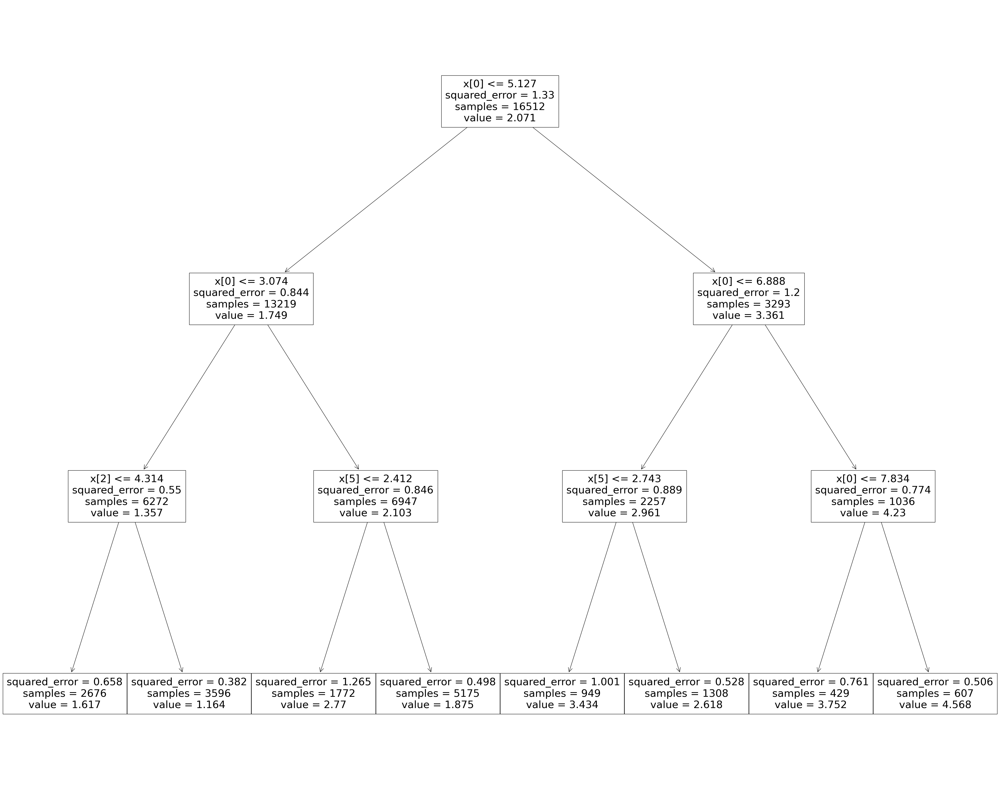

In [14]:
from sklearn.tree import plot_tree
plt.rcParams['figure.figsize'] = (50,40)
plot_tree(dtr);

#### Feature Importance

In [15]:
dtr.feature_names_in_

array(['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population',
       'AveOccup', 'Latitude', 'Longitude'], dtype=object)

In [16]:
dtr.feature_importances_

array([0.85183924, 0.        , 0.02683539, 0.        , 0.        ,
       0.12132537, 0.        , 0.        ])

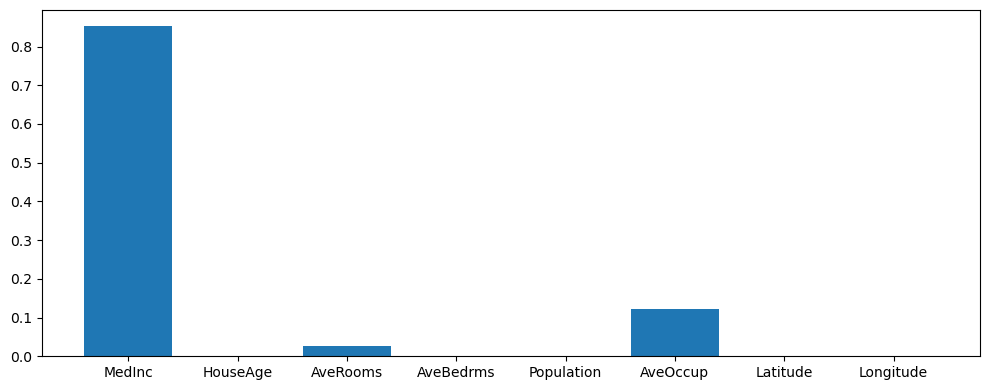

In [17]:
plt.figure(figsize=(10,4))
plt.bar(x=dtr.feature_names_in_,height=dtr.feature_importances_)
plt.tight_layout();